<a href="https://colab.research.google.com/github/raceregos/raceregos/blob/main/unsupervised.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Saved to sonar_clusters_raw.csv


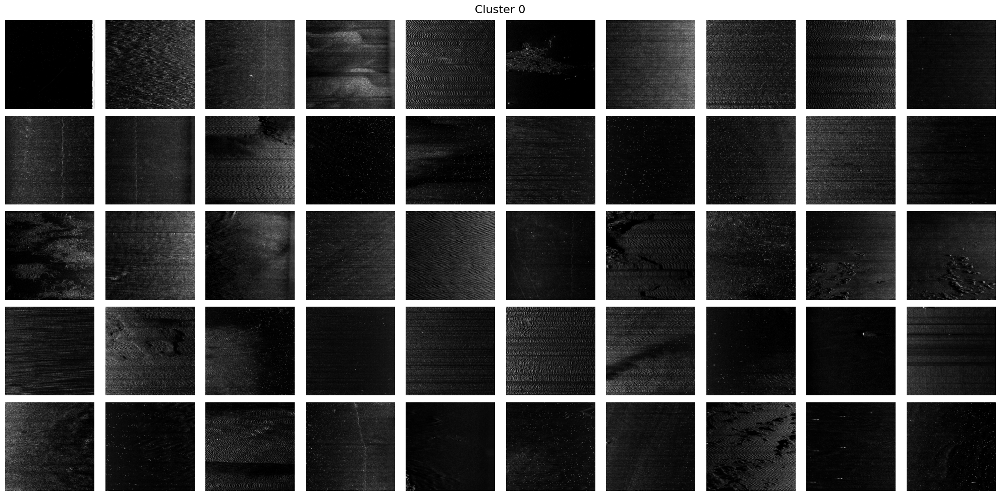

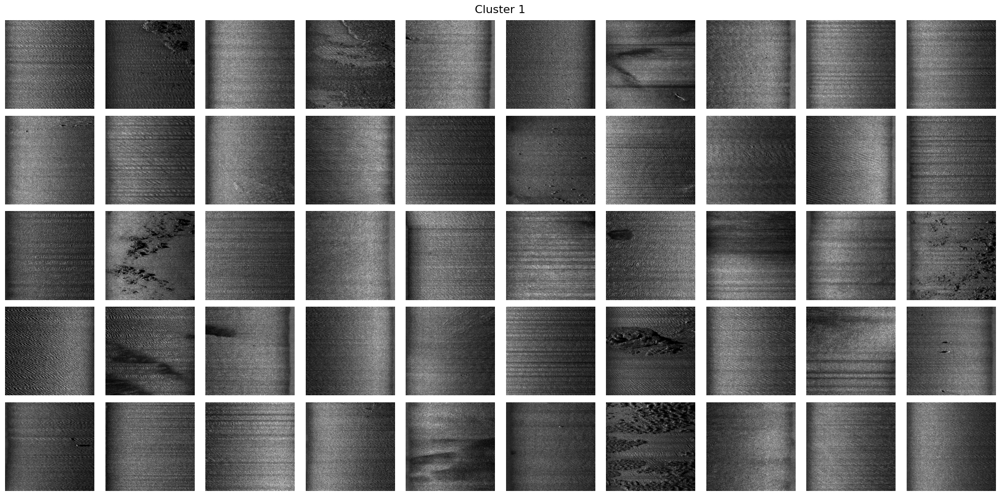

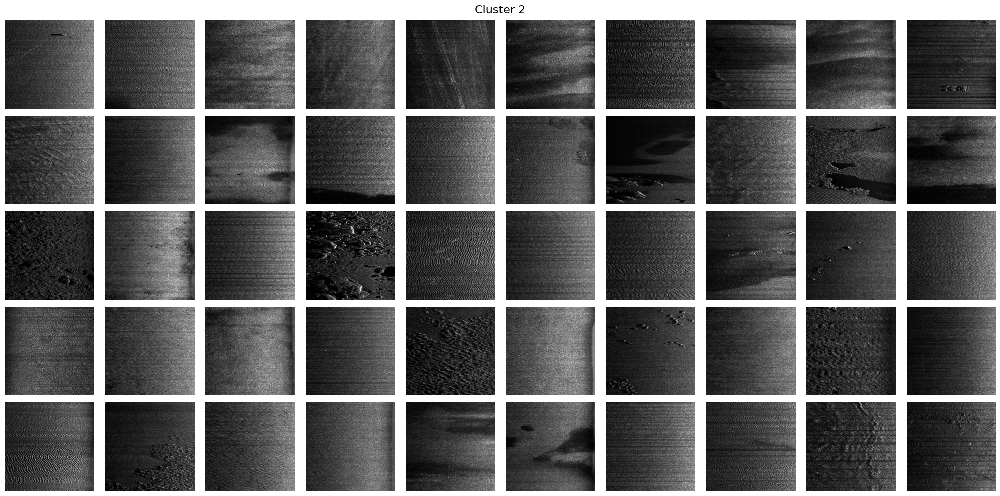

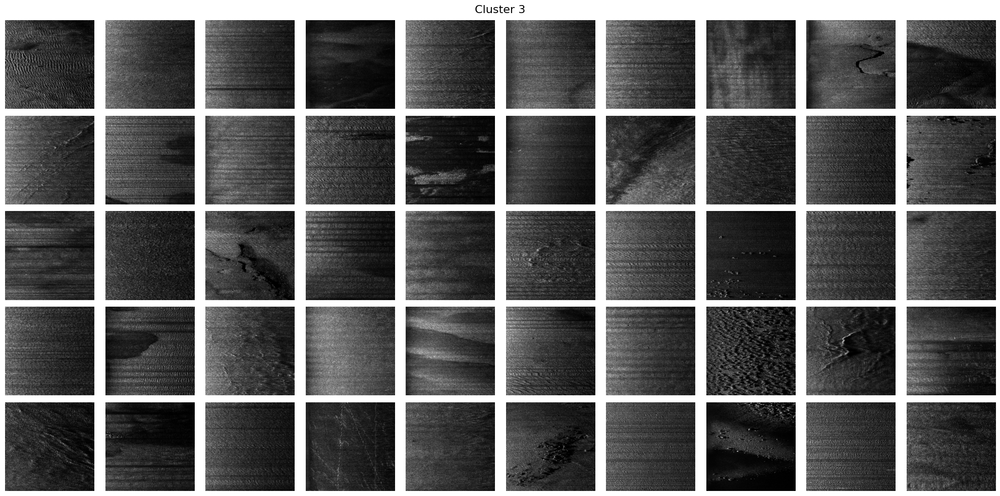

In [8]:
from sklearn.cluster import KMeans
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd

# --- Config ---
DATA_DIR = '/content/drive/MyDrive/ssl_dataset'  # Mounted Google Drive path
IMAGE_SIZE = (256, 256)
N_CLUSTERS = 4  # Change as needed
SAMPLE_PER_CLUSTER = 50

# --- Dataset ---
class SonarDataset(Dataset):
    def __init__(self, root, transform=None):
        self.filenames = [f for f in os.listdir(root) if f.lower().endswith('.tiff')]
        self.root = root
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        img = Image.open(os.path.join(self.root, self.filenames[idx])).convert('L')
        if self.transform:
            img = self.transform(img)
        return img, self.filenames[idx]

# --- Transforms and Dataset ---
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
])
dataset = SonarDataset(DATA_DIR, transform=transform)
loader = DataLoader(dataset, batch_size=1, shuffle=False)

# --- Flatten images for clustering ---
features = []
filenames = []
for img, fname in loader:
    features.append(img.view(-1).numpy())  # Flatten to 1D
    filenames.append(fname[0])
features = np.stack(features)

# --- Run KMeans ---
kmeans = KMeans(n_clusters=N_CLUSTERS, random_state=0)
clusters = kmeans.fit_predict(features)

# --- Save cluster labels ---
df = pd.DataFrame({'filename': filenames, 'cluster': clusters})
df.to_csv('/content/sonar_clusters_raw.csv', index=False)
print("Saved to sonar_clusters_raw.csv")

# --- Plot sample images from each cluster ---
for c in range(N_CLUSTERS):
    idxs = np.where(clusters == c)[0]
    sample_idxs = np.random.choice(idxs, size=min(50, len(idxs)), replace=False)

    fig, axes = plt.subplots(5, 10, figsize=(20, 10))
    fig.suptitle(f'Cluster {c}', fontsize=16)
    for i, idx in enumerate(sample_idxs):
        row, col = divmod(i, 10)
        img = Image.open(os.path.join(DATA_DIR, filenames[idx])).convert('L')
        axes[row, col].imshow(img.resize(IMAGE_SIZE), cmap='gray')
        axes[row, col].axis('off')
    plt.tight_layout()
    plt.show()
